## algorithm design and anlysis-2026 spring  homework 1 
**Deadline**：2026.5.20

**name**:


note：
---
1. 带有\*的题目，申请免上课的同学，必须完成，其他同学选作；
2. 请独立完成，如求助了他人或者大模型，请著明，并且不可省略算法分析部分；
4. 如若作答有雷同，全部取消成绩；
3. 需要书面作答的题目，可以通过引用图片的形式添加，但是注意上传项目时包含所引用的图片的源文件；
4. $log_n$ 默认表示$log_2{n}$;

## 问题 1

根据下列递归公式, 计算下列 $T(n)$ 对应的的渐近上界。要求所求的边界尽可能的紧（tight）, 请写明步骤。

1. $T(1)=1; T(n)=T(n/4)+1$ for $n>1$
2. $T(1)=1;T(n)=3T(n/3)+n^2$ for $n>1$
3. $T(1)=1;T(n)=T(2n/3)+1$ for $n>1$
4. $T(1)=1;T(n)=5T(n/4)+n$ for $n>1$
5. $T(n)=1 \ for\ n \le 2 ; T(n)=T(\sqrt{n})+1 \ for \ n>2$

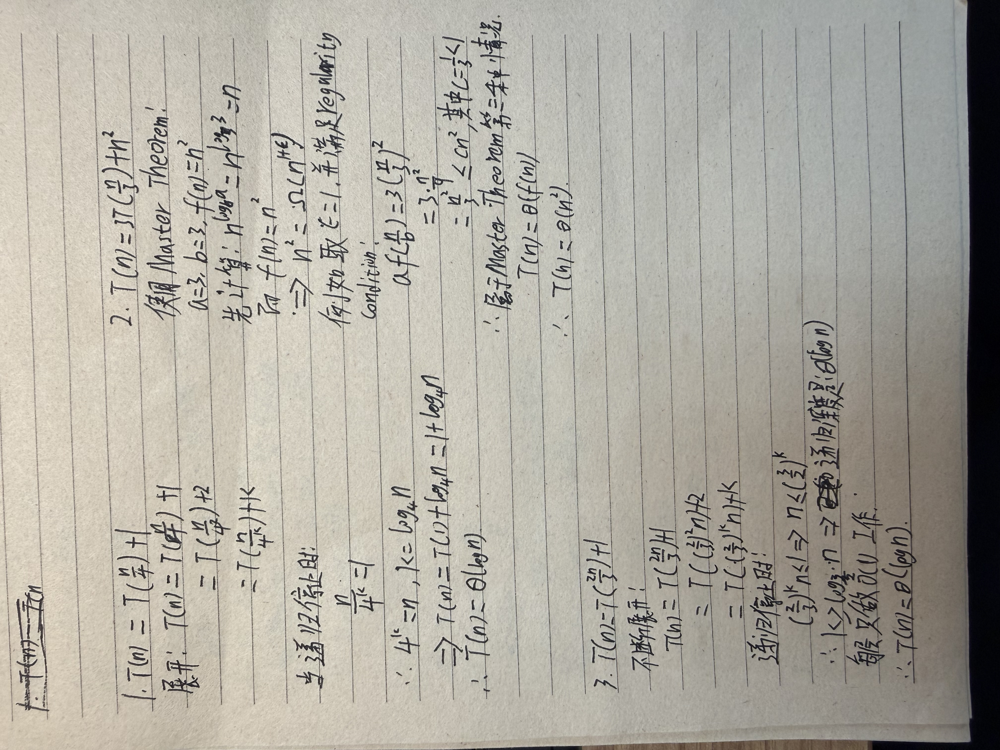
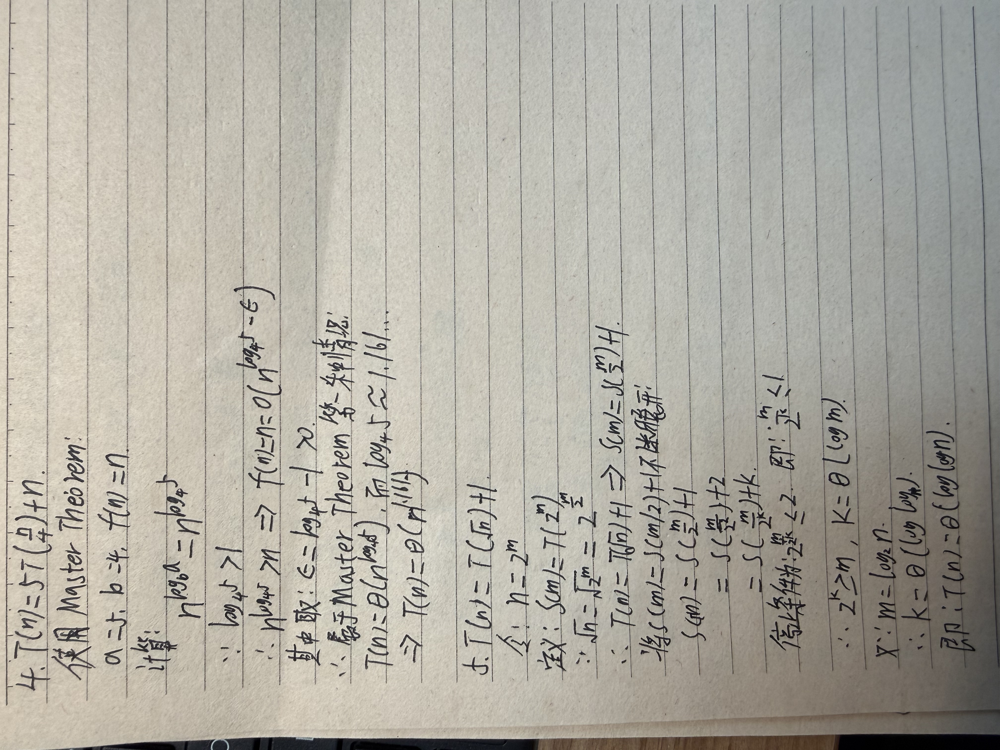

## 问题 2

观察下方的分治算法（divide-and-conquer algorithm）的伪代码, 回答下面问题

```latex
DoSomething(A,p,r)
-----
n := r-p+1
if n=2 and A[p]>A[r] then
    swap A[p] and A[r]
else if n >= 3 then
    m = ceil(2n/3)
    DoSomething(A,p,p+m-1)
    DoSomething(A,r-m+1,r)
    DoSomething(A,p,p+m-1)

---
first call: DoSomething(A,1,n)
```

note：$ceil(2n/3)=\left\lceil {2n/3} \right\rceil$；$:=$ 表示赋值, 等价于 $\to$；A是一个包含n的整数元素的数组, 

1. 写出该算法时间复杂度的递归公式, 并求解其对应的渐进表示
2. 描述一下该算法的功能, 并判断是否是最高效的解决方案
3. \* 使用python编程实现上述算法或其对应的更高效版本的算法

idea:

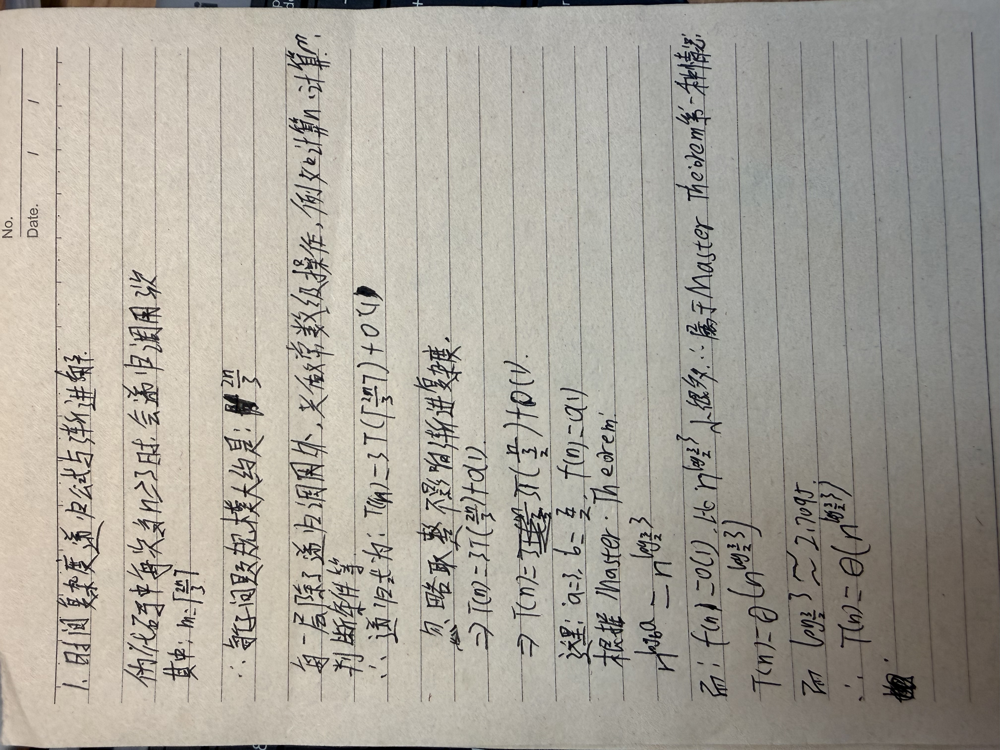

**2.这个算法的功能是：对数组进行排序。**
- 它的思想是：
1. 先排序前 2/3；
2. 再排序后 2/3；
3. 最后再次排序前 2/3。
不过它不是高效算法，其算法复杂度甚至比常见排序算法差。

In [1]:
def do_something(A, p, r):
    n = r - p + 1

    if n <= 1:
        return

    if n == 2 and A[p] > A[r]:
        A[p], A[r] = A[r], A[p]

    elif n >= 3:
        m = (2 * n + 2) // 3  # 等价于 ceil(2n/3)

        do_something(A, p, p + m - 1)
        do_something(A, r - m + 1, r)
        do_something(A, p, p + m - 1)


# 示例
A = [5, 3, 8, 1, 2, 7, 4, 6]
do_something(A, 0, len(A) - 1)
print(A)

[1, 2, 3, 4, 5, 6, 7, 8]


## 问题 3

给定一个包含n个元素的数组 `profits` , 它的第 `i` 个元素 `profits[i]` 表示一支股票第 `i` 天的**收益**（正数表示涨, 负数表示跌）。你只能选择 **某一天** 买入这只股票, 并选择在 **未来的某一个不同的日子** 卖出该股票。

1. 设计一个算法来计算你所能获取的最大利润和对应买入和卖出的日期。请分析算法方案, 计算其时间复杂度, 并且使用python编程实现该算法。

2. \* 设计一个时间复杂度为 $O(n)$的算法实现该算法

e.g. :
---
profits=[3,2,1,-7,5,2,-1,3,-1], 第5天买入, 第8天卖出, 收益最大：9

idea:
代码的核心思想是：
枚举所有可能的买入日期和卖出日期，然后计算对应收益，最后保留收益最大的方案。
具体过程如下：
首先，外层循环枚举买入日期 buy。
例如：
for buy in range(n - 1):
表示买入日期可以从第 1 天到倒数第 2 天，因为卖出日期必须在买入日期之后。
然后，内层循环枚举卖出日期 sell。
for sell in range(buy + 1, n):
表示卖出日期必须在买入日期之后，不能和买入日期是同一天。
在每次固定买入日期后，代码会用 current_profit 累加从买入日到卖出日之间的总收益。
例如对于：
profits = [3, 2, 1, -7, 5, 2, -1, 3, -1]
如果买入日期是第 5 天，卖出日期是第 8 天，那么收益为：
5 + 2 - 1 + 3 = 9
代码每算出一个新的区间收益，就和当前记录的最大收益 best_profit 比较。
如果当前收益更大，就更新：
best_profit = current_profit
best_buy = buy
best_sell = sell
最后返回最大收益，以及对应的买入日期和卖出日期。
由于 Python 下标从 0 开始，而题目通常使用“第几天”这种从 1 开始的表示方式，所以返回时使用了：
best_buy + 1
best_sell + 1

In [ ]:
#  问题1
def max_profit_bruteforce(profits):
    n = len(profits)

    if n < 2:
        raise ValueError("至少需要两天的数据")

    best_profit = float("-inf")
    best_buy = 0
    best_sell = 1

    for buy in range(n - 1):
        current_profit = profits[buy]

        for sell in range(buy + 1, n):
            current_profit += profits[sell]

            if current_profit > best_profit:
                best_profit = current_profit
                best_buy = buy
                best_sell = sell

    return best_profit, best_buy + 1, best_sell + 1


profits = [3, 2, 1, -7, 5, 2, -1, 3, -1]

profit, buy_day, sell_day = max_profit_bruteforce(profits)

print("最大收益:", profit)
print("买入日期:", buy_day)
print("卖出日期:", sell_day)


最大收益: 9
买入日期: 5
卖出日期: 8


In [ ]:
#  问题2
def max_profit_kadane(profits):
    n = len(profits)

    if n < 2:
        raise ValueError("至少需要两天的数据")

    best_profit = profits[0] + profits[1]
    best_buy = 0
    best_sell = 1

    current_profit = profits[0] + profits[1]
    current_buy = 0

    for sell in range(2, n):
        if current_profit + profits[sell] < profits[sell - 1] + profits[sell]:
            current_profit = profits[sell - 1] + profits[sell]
            current_buy = sell - 1
        else:
            current_profit += profits[sell]

        if current_profit > best_profit:
            best_profit = current_profit
            best_buy = current_buy
            best_sell = sell

    return best_profit, best_buy + 1, best_sell + 1


profits = [3, 2, 1, -7, 5, 2, -1, 3, -1]

print(max_profit_kadane(profits))

(9, 5, 8)


## 问题 4

给定一个包含不同整数元素的数组 $ A[1..n]$ ,并且满足条件：$A[1]>A[2]$ 并且 $A[n-1]<A[n]$; 规定：如果一个元素比它两边的邻居元素都小, 即：$A[x]<A[x-1], A[x]<A[x+1]$ , 称这个元素A[x]为“局部最小”。通过遍历一次数组, 我们可以很容易在 $O(n)$的时间复杂度下找到一个局部最小值, 


1. 分析该问题, 设计一个算法在$O(logn)$的时间复杂度下找到一个局部最小(返回数值), 要求：分析算法设计思路, 并且使用python编程实现
2. \* 设计算法找出所有局部最小值, 分析算法设计思路, 并使用python编程实现

e.g.:
---
A=[9, 3, 7, 2, 1, 4, 5 ] 时,  局部最小元素为 3, 1

idea:

算法设计思路

如果直接遍历数组，可以在 O(n) 时间内找到局部最小值。

但是题目要求在 O(log n) 时间内找到一个局部最小值，所以应该使用类似二分查找的思想。

由于题目保证：

数组开头是下降的
数组结尾是上升的

因此，在数组中间一定会出现一个位置，使得数组从下降趋势变成上升趋势。

这个位置就是局部最小值。

二分查找的判断方式

每次取当前查找区间的中间位置 mid。

然后判断 A[mid] 和它左右邻居的大小关系。

情况一：A[mid] 是局部最小值

如果 A[mid] 同时小于左边和右边的元素，那么直接返回 A[mid]。

情况二：左边元素更小

如果 A[mid - 1] 比 A[mid] 更小，说明当前位置左边仍然存在下降趋势。

因为数组最左端本来就是下降的，所以左半部分中一定存在局部最小值。

这时应该去左半部分继续查找。

情况三：右边元素更小

如果 A[mid + 1] 比 A[mid] 更小，说明当前位置右边仍然存在下降趋势。

而数组最右端最终是上升的，所以右半部分中一定存在局部最小值。

这时应该去右半部分继续查找。

时间复杂度分析

这个算法每次只保留一半的数组继续查找。

也就是说，每经过一次判断，问题规模都会大约减少一半。

因此，它的时间复杂度是：

O(log n)

算法只使用了几个变量，例如 left、right、mid，没有使用额外数组，所以空间复杂度是：

O(1)

In [5]:
def find_one_local_minimum(A):
    n = len(A)

    if n < 3:
        raise ValueError("数组长度至少需要为 3")

    if not (A[0] > A[1] and A[n - 2] < A[n - 1]):
        raise ValueError("数组不满足题目给定条件")

    left = 1
    right = n - 2

    while left <= right:
        mid = (left + right) // 2

        # 如果 A[mid] 比左右邻居都小，说明它是局部最小值
        if A[mid] < A[mid - 1] and A[mid] < A[mid + 1]:
            return A[mid]

        # 如果左边元素更小，去左半部分找
        elif A[mid - 1] < A[mid]:
            right = mid - 1

        # 如果右边元素更小，去右半部分找
        else:
            left = mid + 1

    return None
A = [9, 3, 7, 2, 1, 4, 5]

result = find_one_local_minimum(A)

print("找到的一个局部最小值是:", result)

找到的一个局部最小值是: 1


**找出所有局部最小值**
算法设计思路

如果要找出所有局部最小值，就不能只用二分查找。

原因是：数组中可能存在多个局部最小值。

例如：

A = [9, 3, 7, 2, 1, 4, 5]

这个数组中就有两个局部最小值：

3 和 1

如果使用二分查找，只能快速找到其中一个，但无法保证找到全部。

所以，要找出所有局部最小值，最直接的方法就是遍历数组中间的所有元素。

第一个元素和最后一个元素没有左右两个邻居，所以它们不需要检查。

只需要检查中间位置的元素：

如果当前元素比左边小，并且比右边小，那么它就是局部最小值
时间复杂度分析

这个算法需要从左到右检查数组中的每个中间元素。

因此时间复杂度是：

O(n)

如果一共有 k 个局部最小值，那么结果列表中需要存储 k 个元素。

所以空间复杂度是：

O(k)

在最坏情况下，局部最小值的数量可能随着数组长度增长，因此空间复杂度最坏可以看作：

O(n)

In [6]:
def find_all_local_minimums(A):
    n = len(A)

    if n < 3:
        return []

    result = []

    for i in range(1, n - 1):
        if A[i] < A[i - 1] and A[i] < A[i + 1]:
            result.append(A[i])

    return result
A = [9, 3, 7, 2, 1, 4, 5]

result = find_all_local_minimums(A)

print("所有局部最小值是:", result)

所有局部最小值是: [3, 1]


## 问题 5

给定包含n个不同数字的一组数, 寻找一种基于比较的算法在这组数中找到k个最小的数字, 并按顺序输出它们。

1. 将n个数先进行排序, 然后按顺序输出最小的k个数。要求：选择合适的排序算法实现上述操作, 计算算法时间复杂度, 并使用python编程实现。
2. 建立一个包含这n个数的堆（heap）, 并且调用 k 次Extract-min 按顺序输出最小的k个数。使用往空堆中不断插入元素的方法建立堆, 分析这种方法建堆的时间复杂度, 并使用python编程实现
3. \* 假设数组中包含的数据总数目超过了计算机的存储能力, 请设计一个算法, 找到这堆数据的前k小的数值, 计算时间复杂度, 并使用python实现该算法, 假设计算机一定能存储k个数据。

e.g.：
---
数组arr=[5,4,3,2,6,1,88,33,22,107] 的前3个最小数据为：1, 2, 3

idea:

In [7]:
#  第一题
def merge_sort(arr):
    if len(arr) <= 1:
        return arr

    mid = len(arr) // 2

    left = merge_sort(arr[:mid])
    right = merge_sort(arr[mid:])

    return merge(left, right)


def merge(left, right):
    result = []
    i = 0
    j = 0

    while i < len(left) and j < len(right):
        if left[i] < right[j]:
            result.append(left[i])
            i += 1
        else:
            result.append(right[j])
            j += 1

    result.extend(left[i:])
    result.extend(right[j:])

    return result


def k_smallest_by_sorting(arr, k):
    if k < 0 or k > len(arr):
        raise ValueError("k 的取值不合法")

    sorted_arr = merge_sort(arr)

    return sorted_arr[:k]


arr = [5, 4, 3, 2, 6, 1, 88, 33, 22, 107]
k = 3

result = k_smallest_by_sorting(arr, k)

print("前 k 个最小值是:", result)

前 k 个最小值是: [1, 2, 3]


**第二题：**
算法思路

建立一个最小堆。

最小堆的特点是：堆顶元素永远是当前最小值。

所以我们可以先把所有元素一个个插入堆中，然后执行 k 次删除最小值操作。

每次取出的数就是当前最小的数。

时间复杂度

题目要求用“不断插入”的方式建堆。

每插入一个元素需要：

O(log n)

一共插入 n 个元素，所以建堆时间是：

O(n log n)

之后取出 k 次最小值，每次需要：

O(log n)

所以取出部分是：

O(k log n)

总时间复杂度是：

O(n log n + k log n)

可以简写为：

O(n log n)

In [8]:
import heapq


def k_smallest_by_min_heap(arr, k):
    if k < 0 or k > len(arr):
        raise ValueError("k 的取值不合法")

    heap = []

    for x in arr:
        heapq.heappush(heap, x)

    result = []

    for _ in range(k):
        result.append(heapq.heappop(heap))

    return result


arr = [5, 4, 3, 2, 6, 1, 88, 33, 22, 107]
k = 3

print(k_smallest_by_min_heap(arr, k))

[1, 2, 3]


**第三题：算法思路**

如果数据太大，不能全部存入内存，就不能排序整个数组，也不能建立包含所有元素的堆。

这时可以只维护一个大小为 k 的大顶堆。

大顶堆中保存当前已经见过的最小 k 个数。

当读入一个新数字时：

如果它比堆中最大的数还大，就丢弃它
如果它比堆中最大的数小，就替换掉堆中最大的数

这样处理完所有数据后，堆里剩下的就是最小的 k 个数。

最后把这 k 个数排序输出。

时间复杂度

每个元素最多操作一次堆。

堆的大小始终是 k，所以每次操作需要：

O(log k)

一共有 n 个元素，所以总时间复杂度是：

O(n log k)

空间复杂度是：

O(k)

In [9]:
import heapq


def k_smallest_large_data(data_stream, k):
    if k <= 0:
        return []

    max_heap = []

    for x in data_stream:
        if len(max_heap) < k:
            heapq.heappush(max_heap, -x)
        else:
            largest = -max_heap[0]

            if x < largest:
                heapq.heapreplace(max_heap, -x)

    result = [-x for x in max_heap]
    result.sort()

    return result


arr = [5, 4, 3, 2, 6, 1, 88, 33, 22, 107]
k = 3

print(k_smallest_large_data(arr, k))

[1, 2, 3]


## 问题 6

> 星球碰撞问题：现有n个星球，在同一条直线上运行，如数组A所示，元素的绝对值表示星球的质量，负数表示星球自右向左运动，正数表示星球自左向右运动，当两个星球相撞的时候，质量小的会消失，大的保持不变，**质量相同的两个星球碰撞后自右向左运动的星球消失，自左向右的星球保持不变**，假设所有星球的速度大小相同。
>
> $ A=[23,-8, 9, -3, -7, 9, -23, 22] $

请设计一个算法模拟星球的运行情况，输出最终的星球存续情况（输出一个数组），分析算法设计思路，计算时间复杂度，并基于python编程实现。

e.g.
---
1.  输入： A=[-3,-6,2,8, 5,-8,9,-2,1]， 输出：[-3, -6, 2, 8, 9, 1]

2. 输入：A=[23,-8, 9, -3, -7, 9, -23, 22], 输出：[23, 22]

idea:

算法思路

这个问题可以使用栈来模拟星球碰撞。

数组中的星球从左到右排列：

正数：向右运动
负数：向左运动

只有一种情况会发生碰撞：

前面有一个向右运动的星球，后面来了一个向左运动的星球

也就是：

栈顶元素 > 0，并且当前元素 < 0

其他情况不会碰撞，例如：

两个都向左
两个都向右
前面向左，后面向右
碰撞规则

设当前星球为 x，栈顶星球为 top。

如果它们发生碰撞：

如果 top 的质量小于 x 的质量，说明栈顶星球消失，当前星球继续向左运动，可能还会继续碰撞。
如果 top 的质量大于 x 的质量，说明当前星球消失。
如果质量相等，根据题目规则：
向左运动的星球消失，向右运动的星球保留。
所以当前负数星球消失，栈顶正数星球保留。
时间复杂度分析

每个星球最多进栈一次，最多出栈一次。

所以总的时间复杂度是：

O(n)

栈中最多保存 n 个星球，所以空间复杂度是：

O(n)

In [ ]:
def asteroid_collision(A):
    stack = []

    for x in A:
        alive = True

        while alive and stack and stack[-1] > 0 and x < 0:
            top = stack[-1]

            if abs(top) < abs(x):
                stack.pop()

            elif abs(top) > abs(x):
                alive = False

            else:
                alive = False

        if alive:
            stack.append(x)

    return stack

In [11]:
A = [-3, -6, 2, 8, 5, -8, 9, -2, 1]

result = asteroid_collision(A)

print(result)

[-3, -6, 2, 8, 9, 1]


In [12]:
A = [23, -8, 9, -3, -7, 9, -23, 22]

result = asteroid_collision(A)

print(result)

[23, 22]


## 问题 7

> 0-1背包问题：现在有4块大理石，每个大理石对应的重量和价值使用一个元组表示, 即（重量，价值），4块大理石的重量和价值为：[(5,10), (4,40), (6,30), (3, 50)], 假设你有一辆最大承重为9的小推车，请问使用这个小推车装大理石的最大价值为多少

请设计一个算法解决该问题，分析算法设计思路，计算时间复杂度，并基于python编程实现

idea:

算法思路

这是一个典型的 0-1 背包问题。

所谓 0-1 背包，意思是：

每块大理石只有两种选择：装入或者不装入
不能只装一部分，也不能重复装同一块

我们可以使用 动态规划 来解决。

定义一个二维数组 dp：

dp[i][w] 表示：
只考虑前 i 块大理石，在最大承重为 w 时，能够获得的最大价值

对于每块大理石，有两种情况：

1. 不装这块大理石
2. 如果装得下，就尝试装入这块大理石

然后取这两种情况中价值更大的那个。

时间复杂度

假设有 n 块大理石，小推车容量为 capacity。

动态规划需要遍历每一块大理石，也要遍历每一种可能的容量。

所以时间复杂度是：

O(n * capacity)

空间复杂度也是：

O(n * capacity)

In [ ]:
def knapsack_01(items, capacity):
    n = len(items)

    dp = [[0] * (capacity + 1) for _ in range(n + 1)]

    for i in range(1, n + 1):
        weight, value = items[i - 1]

        for w in range(capacity + 1):
            dp[i][w] = dp[i - 1][w]

            if weight <= w:
                dp[i][w] = max(
                    dp[i][w],
                    dp[i - 1][w - weight] + value
                )

    return dp[n][capacity]


items = [(5, 10), (4, 40), (6, 30), (3, 50)]
capacity = 9

result = knapsack_01(items, capacity)

print("最大价值为:", result)

最大价值为: 90


## 问题 8

给你二叉搜索树的根节点 root ，该树中的恰好两个节点的值被错误地交换。请在不改变其结构的情况下，恢复这棵树 。设计算法解决该问题，分析算法设计思路，计算时间复杂度，并基于python编程实现

e.g.:
---
1.

<div style="text-align:center;width:200px;"> <img alt="" src="./fig/hw3q9-1.jpg"> </div>
输入：root = [1,3,null,null,2]， 输出为：[3,1,null,null,2]， 

解释：3 不能是 1 的左孩子，因为 3 > 1 。交换 1 和 3 使二叉搜索树有效。

2.

 <div style="text-align:center;width:200px;"> <img alt="" src="./fig/hw3q9-1.jpg"> </div>
输入： root=[3,1,4,null,null,2]， 输出为：[2,1,4,null,null,3]

解释：2 不能在 3 的右子树中，因为 2 < 3 。交换 2 和 3 使二叉搜索树有效。

idea:

算法思路

二叉搜索树有一个重要性质：

对二叉搜索树进行中序遍历，得到的结果应该是递增序列

例如一棵正确的二叉搜索树，中序遍历结果可能是：

1, 2, 3, 4, 5

但是题目说有两个节点的值被错误交换了。

那么中序遍历结果中就会出现“顺序错误”的地方。

例如：

1, 3, 2, 4

这里 3 > 2，说明 3 和 2 的位置有问题。

再比如：

1, 4, 3, 2, 5

这里会出现两次顺序错误：

4 > 3
3 > 2

真正被交换的节点是第一次错误中的较大值 4，以及第二次错误中的较小值 2。

因此算法步骤是：

1. 对二叉搜索树进行中序遍历
2. 在遍历过程中找到顺序错误的两个节点
3. 交换这两个节点的值
4. 不改变树的结构
时间复杂度

中序遍历需要访问每一个节点一次，所以时间复杂度是：

O(n)

其中 n 是二叉树中的节点数量。

递归遍历需要使用函数调用栈，最坏情况下空间复杂度是：

O(n)

如果树比较平衡，空间复杂度大约是：

O(log n)

In [ ]:
from collections import deque


class TreeNode:
    def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right


def build_tree(values):
    if not values or values[0] is None:
        return None

    root = TreeNode(values[0])
    queue = deque([root])
    i = 1

    while queue and i < len(values):
        node = queue.popleft()

        if i < len(values) and values[i] is not None:
            node.left = TreeNode(values[i])
            queue.append(node.left)
        i += 1

        if i < len(values) and values[i] is not None:
            node.right = TreeNode(values[i])
            queue.append(node.right)
        i += 1

    return root


def tree_to_list(root):
    if root is None:
        return []

    result = []
    queue = deque([root])

    while queue:
        node = queue.popleft()

        if node is None:
            result.append(None)
        else:
            result.append(node.val)
            queue.append(node.left)
            queue.append(node.right)

    while result and result[-1] is None:
        result.pop()

    return result


def recover_tree(root):
    first = None
    second = None
    prev = None

    def inorder(node):
        nonlocal first, second, prev

        if node is None:
            return

        inorder(node.left)

        if prev is not None and prev.val > node.val:
            if first is None:
                first = prev
            second = node

        prev = node

        inorder(node.right)

    inorder(root)

    if first is not None and second is not None:
        first.val, second.val = second.val, first.val

    return root


# 示例 1
root = build_tree([1, 3, None, None, 2])
recover_tree(root)
print(tree_to_list(root))

# 示例 2
root = build_tree([3, 1, 4, None, None, 2])
recover_tree(root)
print(tree_to_list(root))

[3, 1, None, None, 2]
[2, 1, 4, None, None, 3]


## 问题 9 \*
给定 `n` 个非负整数表示每个宽度为 `1` 的柱子的高度图，计算按此排列的柱子，下雨之后能接多少雨水。



<div style="text-align:center;width:800px;"> <img alt="" src="./fig/hw3q6.png"> </div>

请分析算法设计思路，计算时间复杂度，并基于python编程实现

idea:

算法思路

这个问题可以使用 双指针法 解决。

我们用两个指针：

left 指向数组左边
right 指向数组右边

同时维护两个变量：

left_max：从左边到当前位置遇到的最高柱子
right_max：从右边到当前位置遇到的最高柱子

判断当前位置能接多少水时，只需要看它左右两边较矮的那一侧。

如果左边最高柱子比右边最高柱子矮，就处理左边；
否则处理右边。

因为水的高度取决于左右两边较矮的柱子。

时间复杂度分析

整个数组只会被左右指针扫描一遍。

所以时间复杂度是：

O(n)

只使用了几个变量，没有使用额外数组。

所以空间复杂度是：

O(1)

In [15]:
def trap(height):
    if not height:
        return 0

    left = 0
    right = len(height) - 1

    left_max = 0
    right_max = 0

    water = 0

    while left < right:
        if height[left] < height[right]:
            if height[left] >= left_max:
                left_max = height[left]
            else:
                water += left_max - height[left]

            left += 1

        else:
            if height[right] >= right_max:
                right_max = height[right]
            else:
                water += right_max - height[right]

            right -= 1

    return water

In [16]:
height = [0, 1, 0, 2, 1, 0, 1, 3, 2, 1, 2, 1]

print(trap(height))

6


In [17]:
height = [4, 2, 0, 3, 2, 5]

print(trap(height))

9


## 问题 10

给你一个二叉树的根节点 root ，树中每个节点都存放有一个 0 到 9 之间的数字。每条从根节点到叶节点的路径都代表一个数字：

> 例如，从根节点到叶节点的路径 1 -> 2 -> 3 表示数字 123 。

设计一个算法计算从根节点到叶节点生成的所有数字之和 ，分析算法设计思路，计算时间复杂度，并基于python编程实现

叶节点:是指没有子节点的节点。

e.g.:
---
1.

 <div style="text-align:center;width:200px;"> <img alt="figure" src="./fig/hw3q10-1.jpg"> </div>

 输入：root = [1,2,3], 输出：25

解释：从根到叶子节点路径 1->2 代表数字 12，1->3 代表数字 13，因此和为 12 + 13 = 25 。

2.

 <div style="text-align:center;width:200px;"> <img alt="figure" src="./fig/hw3q10-2.jpg"> </div>

 输入：root = [4,9,0,5,1], 输出：1026

解释：从根到叶子节点路径 4->9->5 代表数字 495，4->9->1 代表数字 491，4->0 代表数字 40。因此和为 495 + 491 + 40 = 1026 。

idea:

算法思路

可以使用 深度优先搜索 DFS。

从根节点开始向下遍历，每经过一个节点，就把当前数字更新。

例如当前已经得到数字 12，下一个节点是 3，那么新的数字就是：

123

也就是：

current = current * 10 + node.val

当遍历到叶子节点时，说明已经形成了一个完整数字，把它加入总和。

时间复杂度分析

每个节点只会被访问一次，所以时间复杂度是：

O(n)

其中 n 是二叉树中的节点数量。

递归需要使用函数调用栈，最坏情况下空间复杂度是：

O(n)

如果树比较平衡，空间复杂度大约是：

O(log n)

In [18]:
from collections import deque


class TreeNode:
    def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right


def build_tree(values):
    if not values:
        return None

    root = TreeNode(values[0])
    queue = deque([root])
    i = 1

    while queue and i < len(values):
        node = queue.popleft()

        if i < len(values) and values[i] is not None:
            node.left = TreeNode(values[i])
            queue.append(node.left)
        i += 1

        if i < len(values) and values[i] is not None:
            node.right = TreeNode(values[i])
            queue.append(node.right)
        i += 1

    return root


def sum_numbers(root):
    def dfs(node, current):
        if node is None:
            return 0

        current = current * 10 + node.val

        if node.left is None and node.right is None:
            return current

        return dfs(node.left, current) + dfs(node.right, current)

    return dfs(root, 0)


# 示例 1
root = build_tree([1, 2, 3])
print(sum_numbers(root))

# 示例 2
root = build_tree([4, 9, 0, 5, 1])
print(sum_numbers(root))

25
1026
